***1. Import the necessary libraries***

In [1]:
# Import libraries for data loading and viusalization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

***2. Load data into panda dataframe***

In [ ]:
# Load the data file "BankChurners.csv" and read it as a dataframe
df = pd.read_csv("BankChurners.csv")

# Display the data share and first few rows of the dataframe (10127 rows and 23 columns)
print(df.shape)
print(df.head())

# Print the Datatypes of the dataset (float64(7), int64(10), object(6) )
df.dtypes  

***3. Data Cleaning & Exploration EDA***

***Duplicates***

In [3]:
# check and drop duplicates
def check_and_drop_duplicates(df):
    # Check for duplicates
    duplicates_count = df.duplicated().sum()

    if duplicates_count > 0:
        # Duplicates exist
        print(f"Number of duplicates before dropping: {duplicates_count}")
        df.drop_duplicates(inplace=True)
        print("Duplicates have been dropped.")
    else:
        # No duplicates
        print("No duplicates found in the DataFrame.")

    # Check the number of duplicates after dropping
    print(f"Number of duplicates after dropping: {df.duplicated().sum()}")

# Call the function with your DataFrame
check_and_drop_duplicates(df)

No duplicates found in the DataFrame.
Number of duplicates after dropping: 0


***Missing Values***

In [4]:
# Display columns with missing values
if df.isnull().any().any():
    # Missing values exist
    print(df.isnull().any())
    print("Missing values exist in the DataFrame.")
    # Display total count of missing values in each column
    print(df.isnull().sum())
else:
    # No missing values
    print("No missing values in the DataFrame.")

No missing values in the DataFrame.


***Drop prior classification cols to avoid data leakage & overfitting***

In [5]:
df.drop([df.columns[21],df.columns[22]],axis=1,inplace=True)
df.head(2)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


***Features Distribution & Correlation***

In [ ]:
# Descriptive stat 

# Create lists of categorical and numerical columns
cat_columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
num_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
               'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
               'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Function for descriptive statistics of numerical columns
def describe_numeric(df, num_columns):
    return df[num_columns].describe()

# Function for descriptive statistics of categorical columns
def describe_categorical(df, cat_columns):
    return df[cat_columns].describe()

# Call the functions to display descriptive statistics
print("Descriptive Statistics for Numerical Columns:")
print(describe_numeric(df, num_columns))
print()
print("Descriptive Statistics for Categorical Columns:")
print(describe_categorical(df, cat_columns))


***Identify Columns with Unknown Categories***

In [7]:
# Assuming you already have a DataFrame named df with the necessary columns

cat_columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

unknown_categories = []
unknown_percentages = {}

for col in cat_columns:
    unknown_count = df[df[col] == 'Unknown'][col].count()
    if unknown_count > 0:
        unknown_percentage = (unknown_count / df[col].count()) * 100
        unknown_categories.append(col)
        unknown_percentages[col] = unknown_percentage

if unknown_categories:
    print(f"Columns with unknown categories: {unknown_categories}")
    print("Percentage of unknowns in each column:")
    for col, percentage in unknown_percentages.items():
        print(f"{col}: {percentage:.2f}%")
else:
    print("No columns have unknown categories in the DataFrame.")

Columns with unknown categories: ['Education_Level', 'Marital_Status', 'Income_Category']
Percentage of unknowns in each column:
Education_Level: 15.00%
Marital_Status: 7.40%
Income_Category: 10.98%


***Impute Columns with Unknown Categories***

In [8]:

# Assume df is your DataFrame with the columns: 'Education_Level', 'Marital_Status', 'Income_Category'

def impute_unknown_with_mode(df, columns):
    imputed_count = {}  # Dictionary to store the count of imputed values per column
    total_count = len(df)  # Total number of rows in the DataFrame
    
    for col in columns:
        unique_values = df[col].unique()
        print(f"Unique values in '{col}': {unique_values}")
        
        mode_value = df[col][df[col] != 'Unknown'].mode()[0]  # Calculate the mode of the column excluding 'Unknown'
        imputed_count[col] = sum(df[col] == 'Unknown')  # Count number of imputed values
        df[col] = df[col].replace('Unknown', mode_value)  # Replace 'Unknown' with mode value without using inplace chaining
        
    # Check missing values and print the percentage and number of imputed cases per column
    print("\nMissing Values after Imputation:")
    for col, count in imputed_count.items():
        if count > 0:
            percentage = (count / total_count) * 100
            print(f"Column '{col}': {count} missing values imputed ({percentage:.2f}% of total)")

# Columns to impute 'Unknown' values with mode
columns_to_impute = ['Education_Level', 'Marital_Status', 'Income_Category']

# Call the function to identify unique values and impute 'Unknown' values with mode
impute_unknown_with_mode(df, columns_to_impute)

# Display the DataFrame after imputation
print("\nUpdated DataFrame:")
print(df)

Unique values in 'Education_Level': ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Unique values in 'Marital_Status': ['Married' 'Single' 'Unknown' 'Divorced']
Unique values in 'Income_Category': ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']

Missing Values after Imputation:
Column 'Education_Level': 1519 missing values imputed (15.00% of total)
Column 'Marital_Status': 749 missing values imputed (7.40% of total)
Column 'Income_Category': 1112 missing values imputed (10.98% of total)

Updated DataFrame:
       CLIENTNUM     Attrition_Flag  Customer_Age Gender  Dependent_count  \
0      768805383  Existing Customer            45      M                3   
1      818770008  Existing Customer            49      F                5   
2      713982108  Existing Customer            51      M                3   
3      769911858  Existing Customer            40      F                4   
4      709106358  Existing 

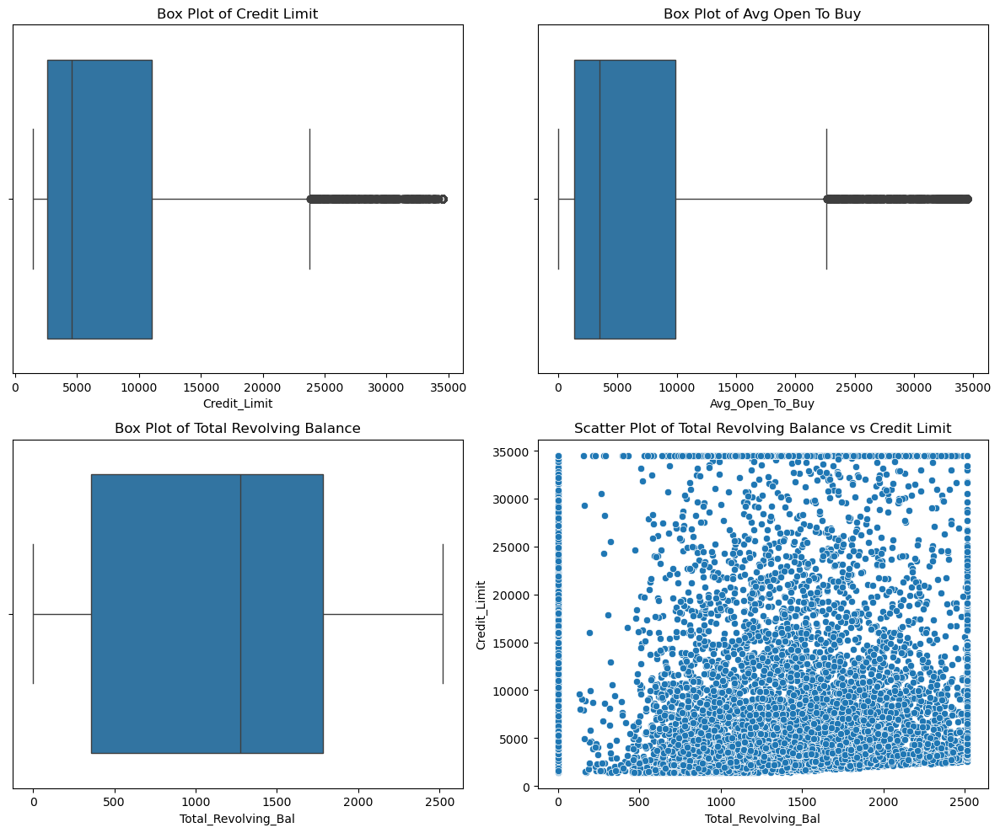

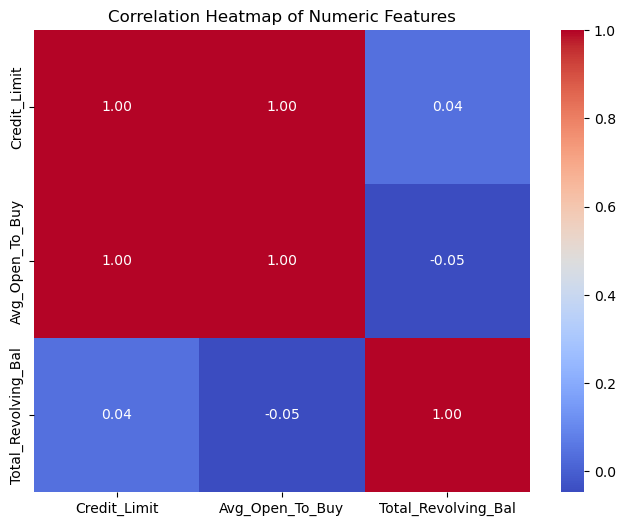

In [9]:
# Examine credit limit and total revloving balance columns & average open to buy for outliers
# Avg_Open_To_Buy and Total_Revolving_Bal are negatively correlated. 

def plot_box_plots_scatter_and_correlation(df):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    sns.boxplot(x='Credit_Limit', data=df, ax=axes[0, 0])
    axes[0, 0].set_title('Box Plot of Credit Limit')

    sns.boxplot(x='Avg_Open_To_Buy', data=df, ax=axes[0, 1])
    axes[0, 1].set_title('Box Plot of Avg Open To Buy')

    sns.boxplot(x='Total_Revolving_Bal', data=df, ax=axes[1, 0])
    axes[1, 0].set_title('Box Plot of Total Revolving Balance')

    sns.scatterplot(x='Total_Revolving_Bal', y='Credit_Limit', data=df, ax=axes[1, 1])
    axes[1, 1].set_title('Scatter Plot of Total Revolving Balance vs Credit Limit')

    plt.tight_layout()

    # Create a correlation matrix
    corr_matrix = df[['Credit_Limit', 'Avg_Open_To_Buy', 'Total_Revolving_Bal']].corr()
    
    # Plot the correlation heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title("Correlation Heatmap of Numeric Features")
    
    plt.show()

# Call the function with your DataFrame (df)
plot_box_plots_scatter_and_correlation(df)

***Customer age***

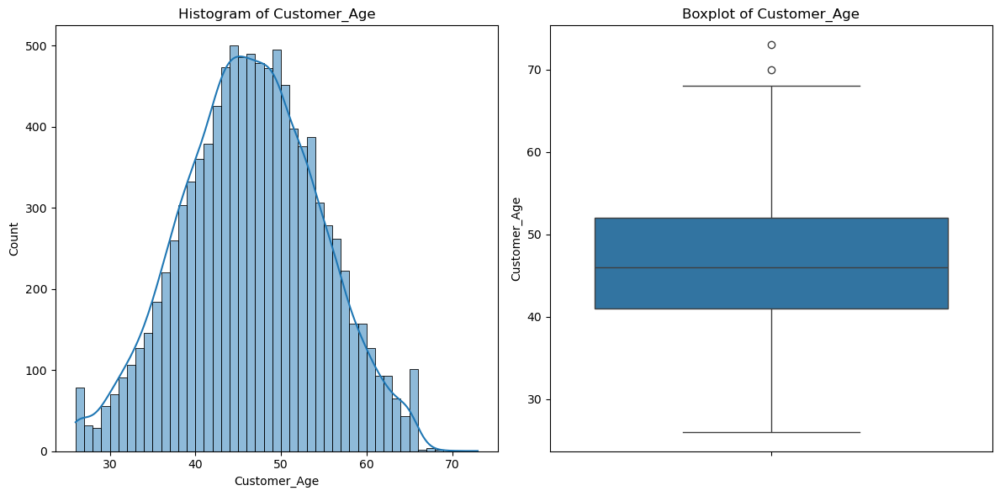

In [10]:

def histogram_boxplot(data, column):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram of {column}')

    plt.subplot(1, 2, 2)
    sns.boxplot(y=data[column])
    plt.title(f'Boxplot of {column}')

    plt.tight_layout()
    plt.show()

# Call the function to plot histogram and boxplot for the 'Customer_Age' column
histogram_boxplot(df, "Customer_Age")

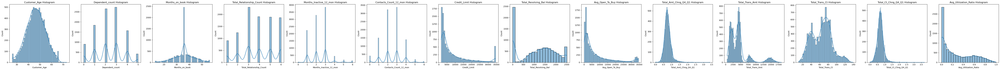

In [11]:
# Numeric Variables Distribution 

def plot_histograms(df, num_columns):
    num_cols = len(num_columns)
    fig, axes = plt.subplots(1, num_cols, figsize=(5*num_cols, 5))

    for i, col in enumerate(num_columns):
        sns.histplot(df[col], ax=axes[i], kde=True)
        axes[i].set_title(f'{col} Histogram')

    plt.tight_layout()
    plt.show()

# Call the function with your DataFrame (df) and num_columns list
plot_histograms(df, num_columns)

***Remove Outliers- Commented Out***

***4. Target Analysis***
***Data is imabalnced & need to be corrected***

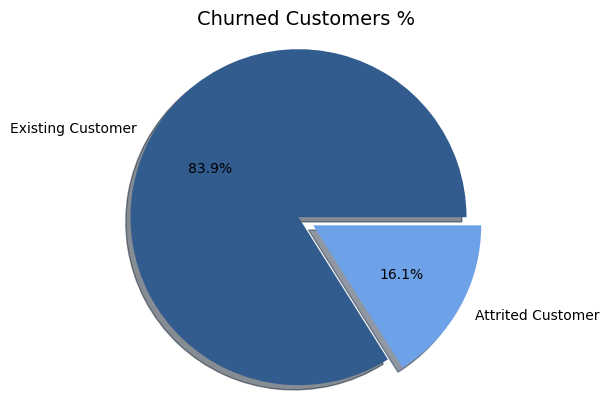

Total number of customers: 10127
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64


In [12]:
# Proportion of Attrited Customers 
target = df ["Attrition_Flag"].value_counts()

fig1, ax1 = plt.subplots()
colors = ['#325b8e', '#6ea2e8']  # Dark blue and light blue colors

ax1.pie(target, labels=target.index, autopct='%1.1f%%', shadow=True, explode=[0.1, 0], colors=colors)
ax1.axis('equal')
plt.title("Churned Customers %", fontsize=14)
plt.show()

print('Total number of customers:', df ['Attrition_Flag'].count())
print(df ['Attrition_Flag'].value_counts())

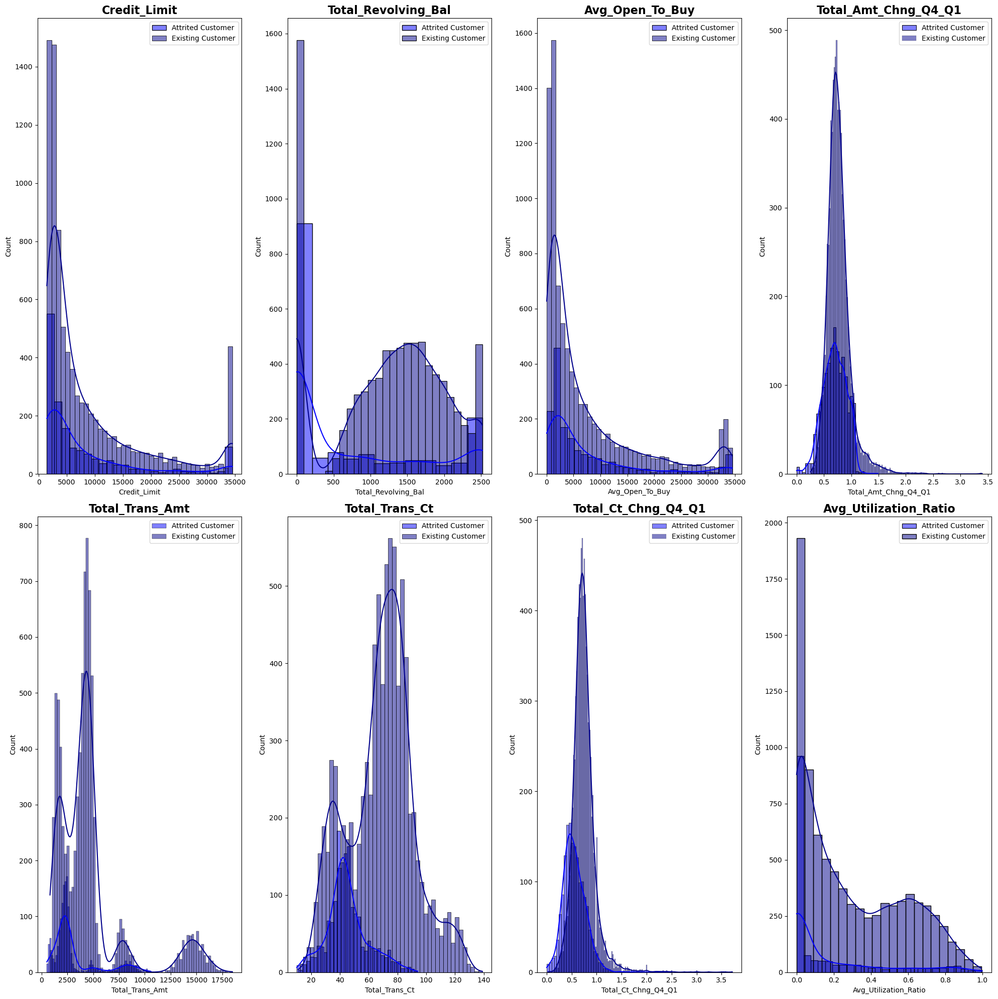

In [13]:
def plot_multiple_columns(df):
    num_cols = len(df.columns)  # Get the number of columns

    fig, axes = plt.subplots(2, min(4, num_cols//4 + (num_cols % 4 > 0)), figsize=(20, 20))
    columns = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
               'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

    colors = ['blue', 'darkblue']

    for i, col in enumerate(columns[:num_cols]):
        for j, attrition_flag in enumerate(['Attrited Customer', 'Existing Customer']):
            sns.histplot(df[col][df['Attrition_Flag'] == attrition_flag], color=colors[j], ax=axes[i // axes.shape[1], i % axes.shape[1]], label=attrition_flag, kde=True)
            axes[i // axes.shape[1], i % axes.shape[1]].set_title(col, fontsize=16, fontweight='semibold')
            axes[i // axes.shape[1], i % axes.shape[1]].legend()

    plt.tight_layout()
    plt.show()

# Call the function with your df_cleaned DataFrame
plot_multiple_columns(df)

***Test Normality***

/Users/ARahim/anaconda3/envs/myenv/lib/python3.11/site-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Shapiro-Wilk test results for Credit_Limit:
Statistic: 0.7418274879455566, p-value: 0.0
The data does not look normally distributed (reject H0)


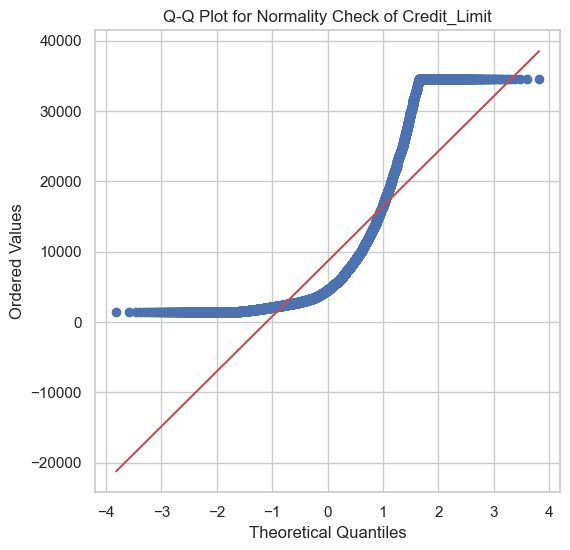

Shapiro-Wilk test results for Total_Revolving_Bal:
Statistic: 0.9154627919197083, p-value: 0.0
The data does not look normally distributed (reject H0)


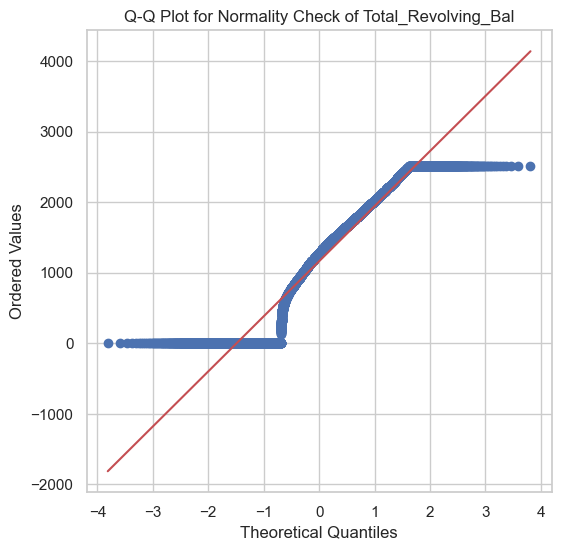

Shapiro-Wilk test results for Avg_Open_To_Buy:
Statistic: 0.7445017695426941, p-value: 0.0
The data does not look normally distributed (reject H0)


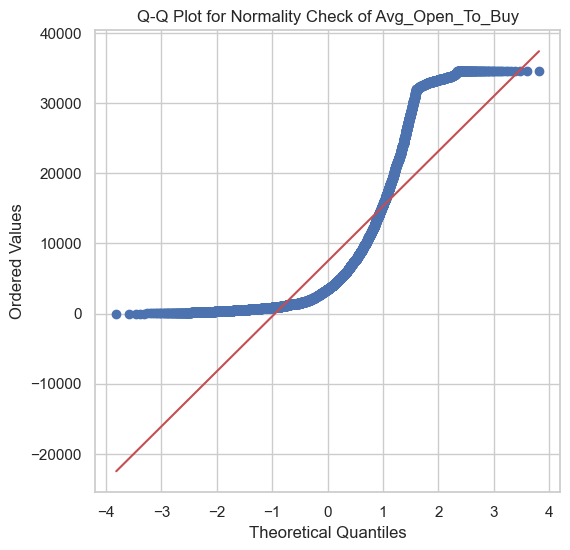

Shapiro-Wilk test results for Total_Amt_Chng_Q4_Q1:
Statistic: 0.903887152671814, p-value: 0.0
The data does not look normally distributed (reject H0)


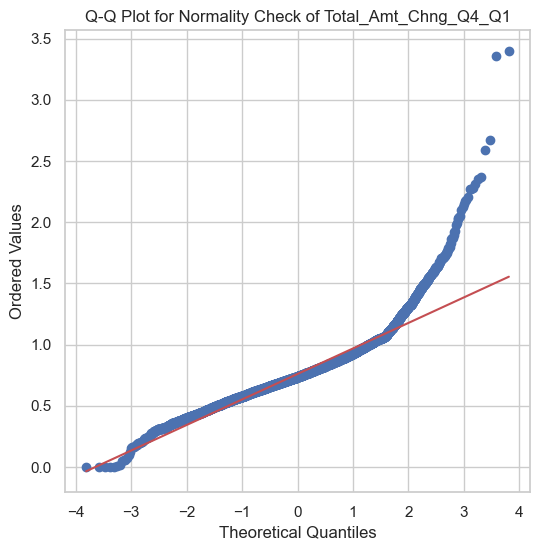

Shapiro-Wilk test results for Total_Trans_Amt:
Statistic: 0.7465307712554932, p-value: 0.0
The data does not look normally distributed (reject H0)


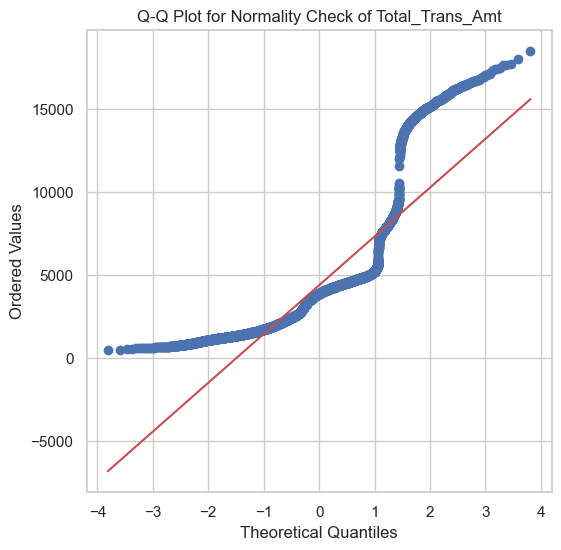

Shapiro-Wilk test results for Total_Trans_Ct:
Statistic: 0.9839121699333191, p-value: 2.86917981920245e-32
The data does not look normally distributed (reject H0)


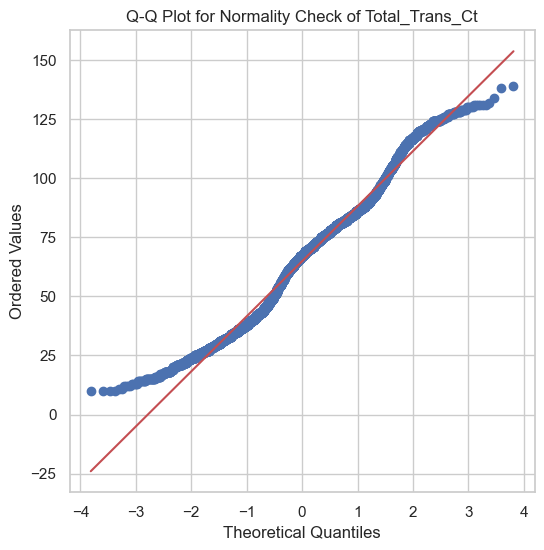

Shapiro-Wilk test results for Total_Ct_Chng_Q4_Q1:
Statistic: 0.8862598538398743, p-value: 0.0
The data does not look normally distributed (reject H0)


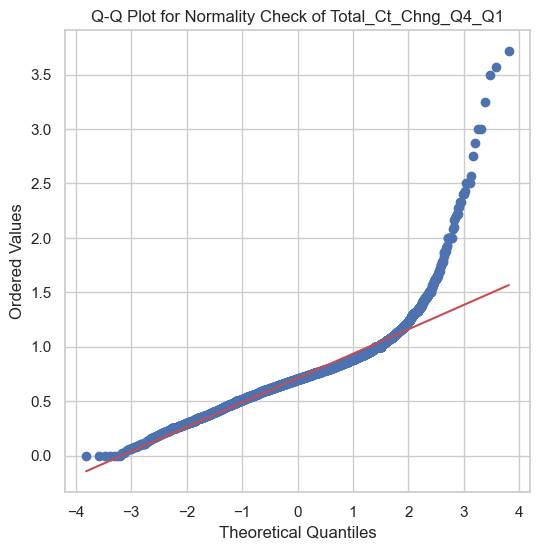

Shapiro-Wilk test results for Avg_Utilization_Ratio:
Statistic: 0.8687229752540588, p-value: 0.0
The data does not look normally distributed (reject H0)


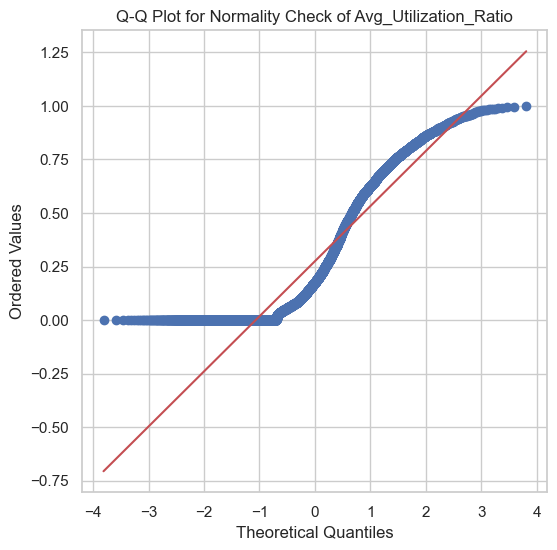

In [14]:
import scipy.stats as stats

def test_normality(df, columns):
    for column in columns:
        # Perform Shapiro-Wilk test for normality
        statistic, p_value = stats.shapiro(df[column])
        alpha = 0.05

        print(f"Shapiro-Wilk test results for {column}:")
        print(f"Statistic: {statistic}, p-value: {p_value}")

        if p_value > alpha:
            print("The data looks normally distributed (fail to reject H0)")
        else:
            print("The data does not look normally distributed (reject H0)")

        # Visualize the Q-Q plot for the selected column
        plt.figure(figsize=(6, 6))
        sns.set(style="whitegrid")
        stats.probplot(df[column], dist="norm", plot=plt)
        plt.title(f"Q-Q Plot for Normality Check of {column}")
        plt.xlabel("Theoretical Quantiles")
        plt.ylabel("Ordered Values")
        plt.show()

# Define the columns to test for normality
columns = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
           'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Call the function with your df_cleaned DataFrame
test_normality(df, columns)

***Bivariate Annalysis***

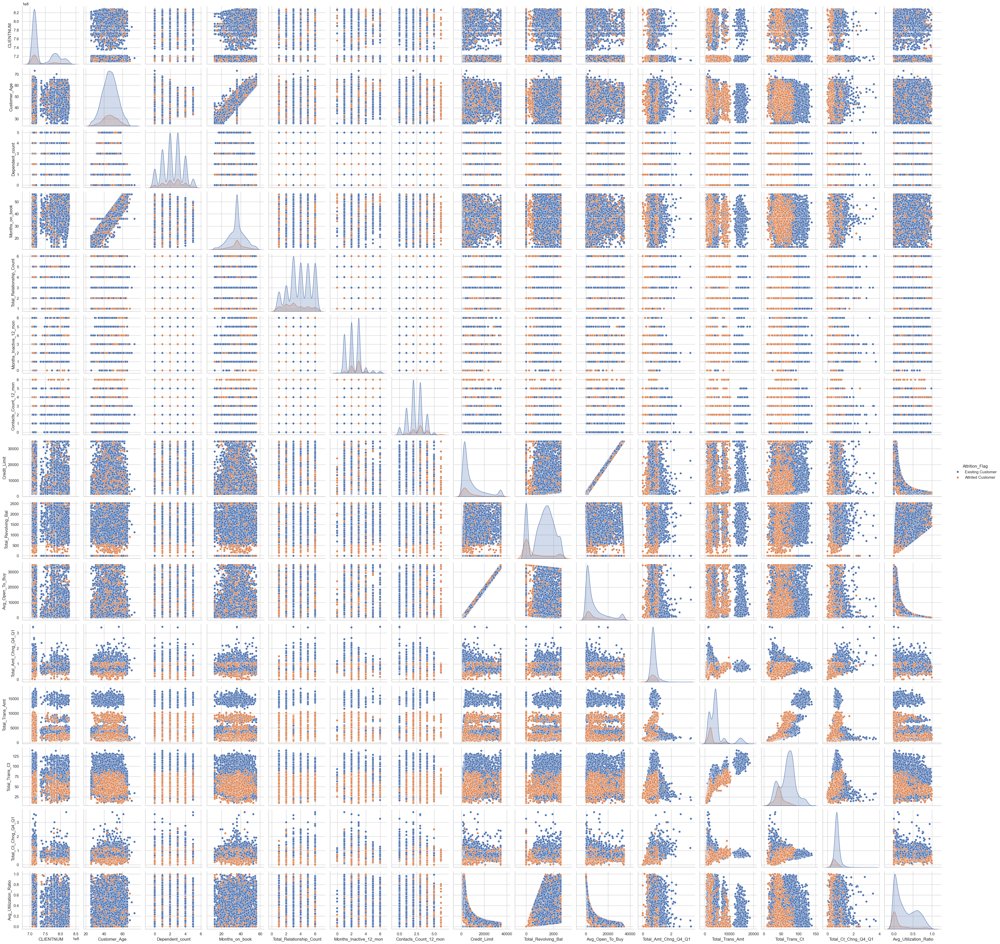

In [15]:
sns.pairplot(df, hue="Attrition_Flag")

***Attrition by income category***

/var/folders/fm/44j74rnn4cn95_4v5x1zgpgr0000gn/T/ipykernel_31544/2050194921.py:6: UserWarning: The palette list has more values (5) than needed (2), which may not be intended.
  sns.countplot(data=df, x="Income_Category", hue="Attrition_Flag", palette=custom_palette)


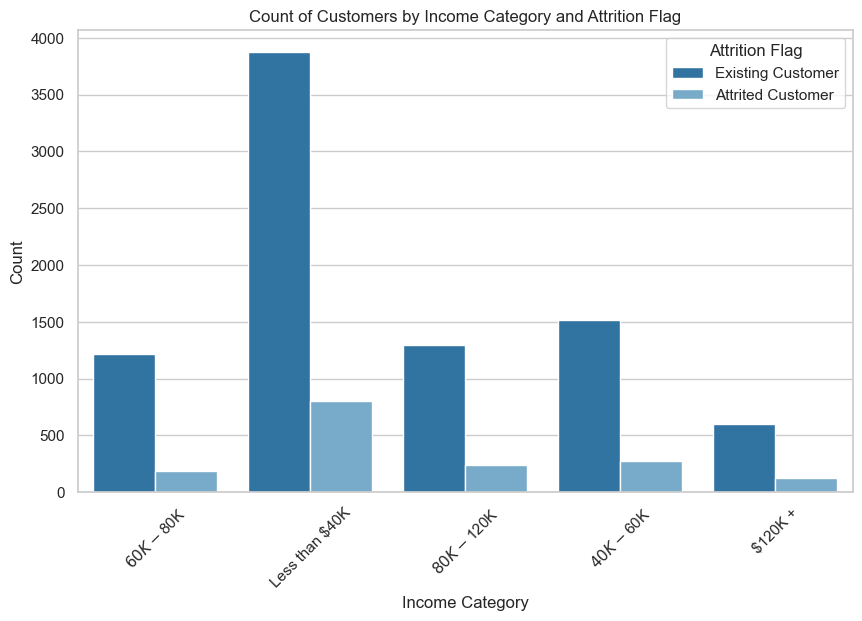

In [16]:
# Create a custom grey and blue color palette
custom_palette = ["#1f77b4", "#6baed6", "#9ecae1", "#c6dbef", "#e0e0e0"]  # Shades of blue and grey

# Create the countplot with the custom grey and blue color palette
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x="Income_Category", hue="Attrition_Flag", palette=custom_palette)
plt.title('Count of Customers by Income Category and Attrition Flag')
plt.xlabel('Income Category')
plt.ylabel('Count')
plt.legend(title='Attrition Flag', loc='upper right')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

***Income Category by education level/card type/Gender***

<Axes: xlabel='Marital_Status', ylabel='count'>

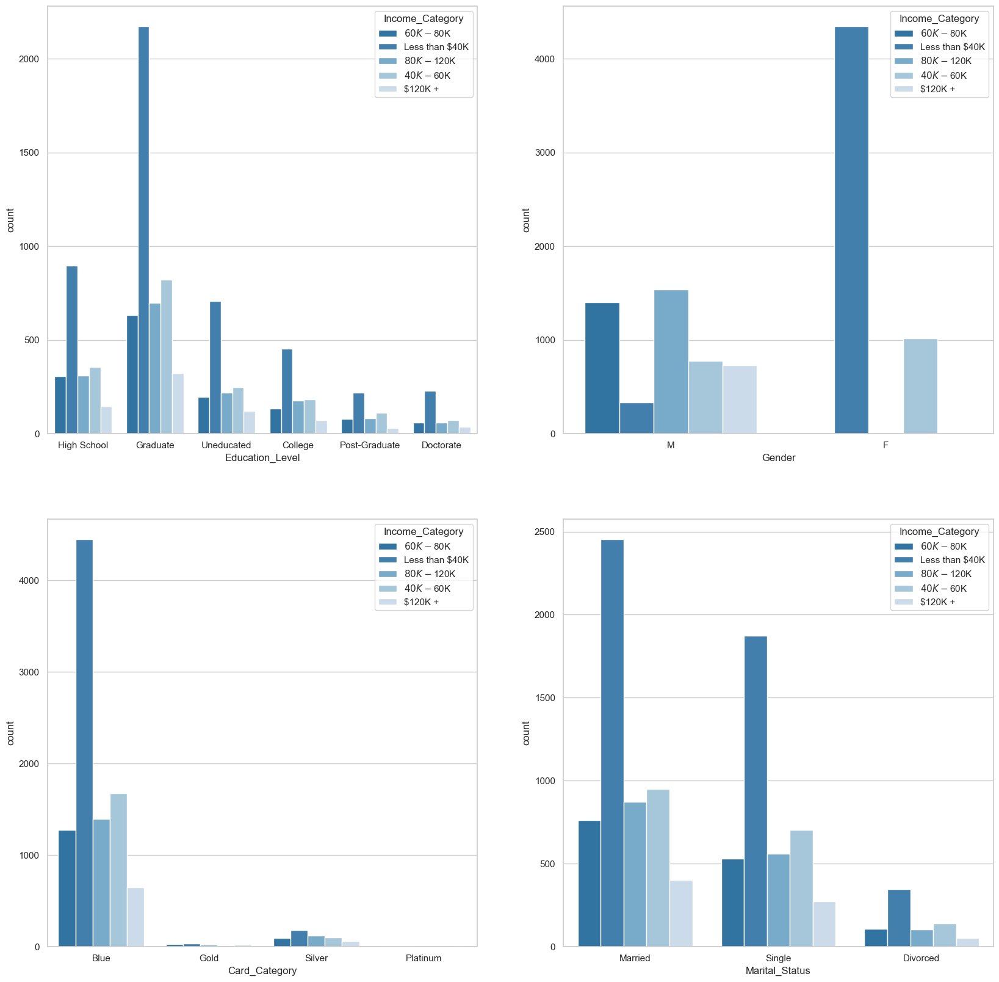

In [17]:


#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(20,20))

#create custom blue color palette
custom_palette = ["#1f77b4", "#3182bd", "#6baed6", "#9ecae1", "#c6dbef"]

#create countplot in each subplot with custom blue color palette
sns.countplot(data=df, hue='Income_Category', x='Education_Level', ax=axes[0,0], palette=custom_palette)
sns.countplot(data=df, hue='Income_Category', x='Gender', ax=axes[0,1], palette=custom_palette)
sns.countplot(data=df, hue='Income_Category', x='Card_Category', ax=axes[1,0], palette=custom_palette)
sns.countplot(data=df, hue='Income_Category', x='Marital_Status', ax=axes[1,1], palette=custom_palette)

***Check correlation***

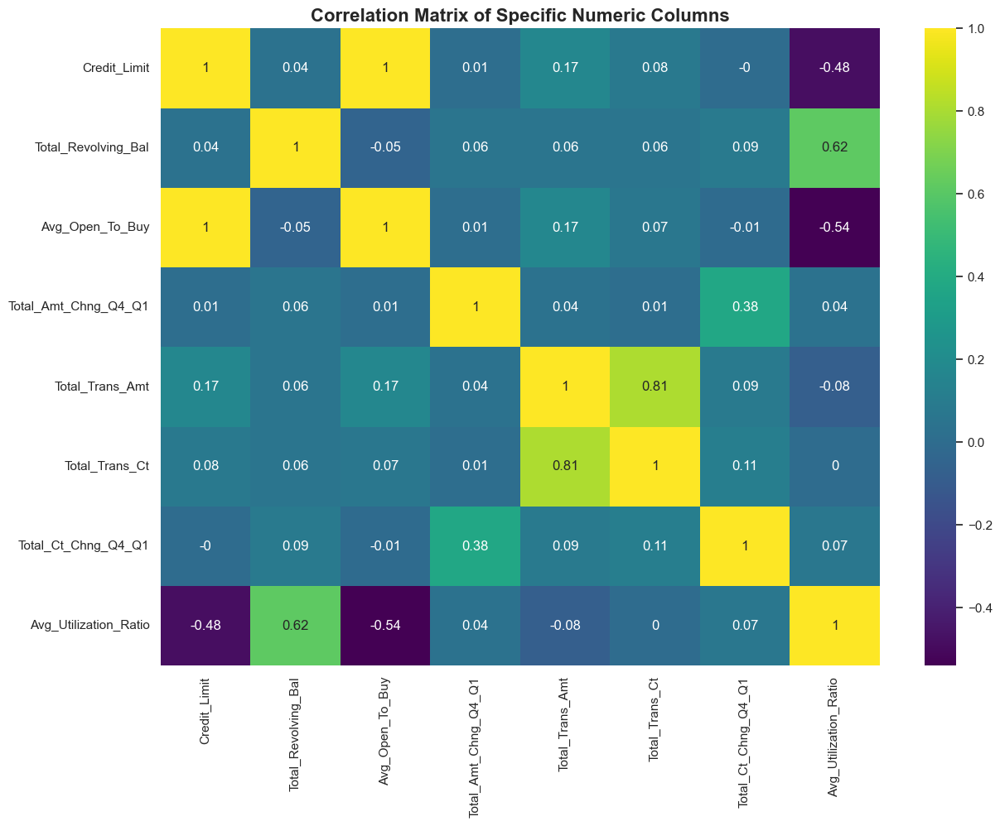

In [18]:

# Selecting the specific columns from the df_cleaned DataFrame
columns = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
           'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
dfco = df[columns]

# Calculate the correlation matrix
cm = dfco.corr().round(2)

# Plotting the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(cm, annot=True, cmap='viridis')

plt.title("Correlation Matrix of Specific Numeric Columns", fontsize=16, fontweight='semibold')
plt.show()